In [1]:
import os
from mu2e import mu2e_ext_path
from mu2e.dataframeprod import DataFrameMaker
from mu2e.mu2eplots import mu2e_plot, mu2e_plot3d
import matplotlib.pyplot as plt
from matplotlib import gridspec
%matplotlib inline
import matplotlib.pyplot as plt
plt.rcParams['figure.figsize'] = (12,8)
import pandas as pd
from time import sleep
import plotly.io as pio
from plotly.offline import init_notebook_mode
from skhep.visual import MplPlotter as splt
from copy import deepcopy
from lmfit import Model, Parameters, report_fit
from hallprobesim_redux import *
from tqdm import tnrange, tqdm_notebook
import pandas as pd
import seaborn as sns

<IPython.core.display.Javascript object>

# Overview Plots

In [4]:
savedir = "/home/ckampa/Plots/FieldFitting/pitt/"

In [2]:
df_1m = DataFrameMaker(mu2e_ext_path+'datafiles/FieldMapsCole/high_granularity_bfield_map_r1m_p10cm_3711104pts_10-07_120052',input_type = 'pkl').data_frame
df_250mm = DataFrameMaker(mu2e_ext_path+'datafiles/FieldMapsCole/high_granularity_bfield_map_cylin_r250mm_p10cm_3846784pts_10-09_085027',input_type = 'pkl').data_frame

In [5]:
phi=np.pi/2
fig = mu2e_plot3d(df_1m, 'R', 'Z', 'Bz', f'R<0.15 and Phi=={phi} and -1.5<Z<1.5',
            title_simp = r'$B_z, \textrm{Tightly Wound Solenoid}$', df_fit=False, mode='plotly_nb', ptype='3d', units='m', aspect='rect2',
                save_dir=savedir, do2pi=True)

/home/ckampa/anaconda3/envs/Mu2E/lib/python3.7/site-packages/plotly/graph_objs/_deprecations.py:174: DeprecationWarning:

plotly.graph_objs.ColorBar is deprecated.
Please replace it with one of the following more specific types
  - plotly.graph_objs.scatter.marker.ColorBar
  - plotly.graph_objs.surface.ColorBar
  - etc.




In [6]:
phi=np.pi/2
fig = mu2e_plot3d(df_250mm, 'R', 'Z', 'Bz', f'R<0.15 and Phi=={phi} and -1.5<Z<1.5',
            title_simp = r'$B_z, \textrm{Loosely Wound Solenoid}$', df_fit=False, mode='plotly_nb', ptype='3d', units='m', aspect='rect2',
                save_dir= savedir, do2pi=True)

/home/ckampa/anaconda3/envs/Mu2E/lib/python3.7/site-packages/plotly/graph_objs/_deprecations.py:174: DeprecationWarning:

plotly.graph_objs.ColorBar is deprecated.
Please replace it with one of the following more specific types
  - plotly.graph_objs.scatter.marker.ColorBar
  - plotly.graph_objs.surface.ColorBar
  - etc.




# Best Fit

In [15]:
cfg_pickle_Opt = cfg_pickle(use_pickle=False, save_pickle=True,
                             load_name='solC_val', save_name='solC_val', recreate=True)
cfg_params_Opt  = cfg_params(pitch1=0.1, ms_h1=2, ns_h1=3,
                                 pitch2=0, ms_h2=0, ns_h2=0,
                                 length1=9.2, ms_c1=5, ns_c1=3,
                                 length2=0, ms_c2=0, ns_c2=0,
                                 ks_dict={'k3':768},
                                 bs_tuples=((0.25, 0, -4.6),
                                            (0.25, 0, 4.6)),
                                 bs_bounds=(1e-3, 1e-3, 4),
                                 version=1000)
hmd, ff = field_map_analysis('fma_opt_test', cfg_data_Cole_250mm_short_cyl,
                                  cfg_geom_Cole_250mm_cyl, cfg_params_Opt,
                                  cfg_pickle_Opt, cfg_plot_none)

recreating fit with func_version=1000,
cfg_params(pitch1=0.1, ms_h1=2, ns_h1=3, pitch2=0, ms_h2=0, ns_h2=0, length1=9.2, ms_c1=5, ns_c1=3, length2=0, ms_c2=0, ns_c2=0, ks_dict={'k3': 768}, bs_tuples=((0.25, 0, -4.6), (0.25, 0, 4.6)), bs_bounds=(0.001, 0.001, 4), version=1000)
Elapsed time was 2.59555 seconds
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 0
    # data points      = 17280
    # variables        = 0
    chi-square         = 1.8138e-05
    reduced chi-square = 1.0496e-09
    Akaike info crit   = -357260.858
    Bayesian info crit = -357260.858
[[Variables]]
    pitch1:   0.1 (fixed)
    ms_h1:    2 (fixed)
    ns_h1:    3 (fixed)
    pitch2:   0 (fixed)
    ms_h2:    0 (fixed)
    ns_h2:    0 (fixed)
    length1:  9.2 (fixed)
    ms_c1:    5 (fixed)
    ns_c1:    3 (fixed)
    length2:  0 (fixed)
    ms_c2:    0 (fixed)
    ns_c2:    0 (fixed)
    Ah1_0_0:  0 (fixed)
    Bh1_0_0:  0 (fixed)
    Ch1_0_0: -4.02566e-11 (fixed)
    Dh1_0_0:  3.611

# Bad Fit

In [13]:
cfg_pickle_Opt = cfg_pickle(use_pickle=False, save_pickle=True,
                             load_name='solC_bad', save_name='solC_bad', recreate=True)
cfg_params_Opt  = cfg_params(pitch1=0, ms_h1=0, ns_h1=0,
                                 pitch2=0.1, ms_h2=2, ns_h2=3,
                                 length1=9.2, ms_c1=5, ns_c1=3,
                                 length2=0, ms_c2=0, ns_c2=0,
                                 ks_dict={'k3':768},
                                 bs_tuples=((0.25, 0, -4.6),
                                            (0.25, 0, 4.6)),
                                 bs_bounds=(1e-3, 1e-3, 4),
                                 version=1000)
hmd, ff = field_map_analysis('fma_opt_test', cfg_data_Cole_250mm_short_cyl,
                                  cfg_geom_Cole_250mm_cyl, cfg_params_Opt,
                                  cfg_pickle_Opt, cfg_plot_none)

recreating fit with func_version=1000,
cfg_params(pitch1=0, ms_h1=0, ns_h1=0, pitch2=0.1, ms_h2=2, ns_h2=3, length1=9.2, ms_c1=5, ns_c1=3, length2=0, ms_c2=0, ns_c2=0, ks_dict={'k3': 768}, bs_tuples=((0.25, 0, -4.6), (0.25, 0, 4.6)), bs_bounds=(0.001, 0.001, 4), version=1000)
Elapsed time was 2.32928 seconds
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 0
    # data points      = 17280
    # variables        = 0
    chi-square         = 2396.88451
    reduced chi-square = 0.13870859
    Akaike info crit   = -34134.5663
    Bayesian info crit = -34134.5663
[[Variables]]
    pitch1:   0 (fixed)
    ms_h1:    0 (fixed)
    ns_h1:    0 (fixed)
    pitch2:   0.1 (fixed)
    ms_h2:    2 (fixed)
    ns_h2:    3 (fixed)
    length1:  9.2 (fixed)
    ms_c1:    5 (fixed)
    ns_c1:    3 (fixed)
    length2:  0 (fixed)
    ms_c2:    0 (fixed)
    ns_c2:    0 (fixed)
    Ah2_0_0: -6.778008e-10 (fixed)
    Bh2_0_0:  1.03046e-10 (fixed)
    Ch2_0_0:  0 (fixed)
    Dh2_

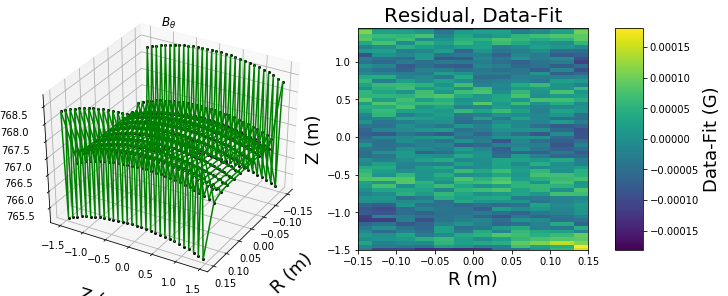

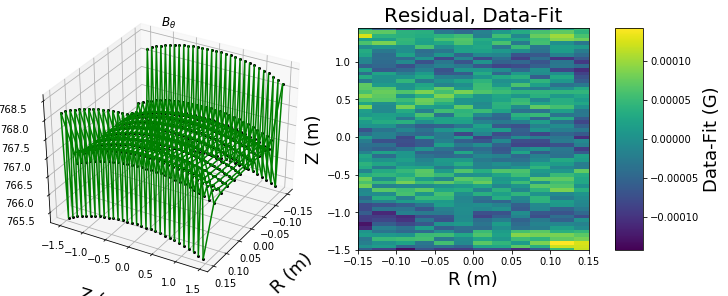

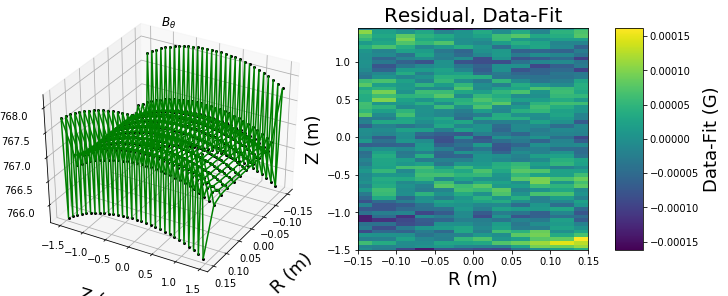

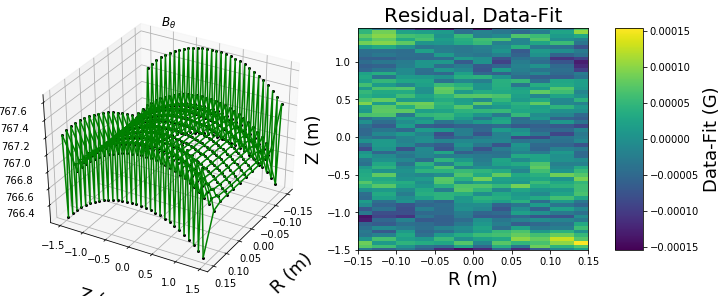

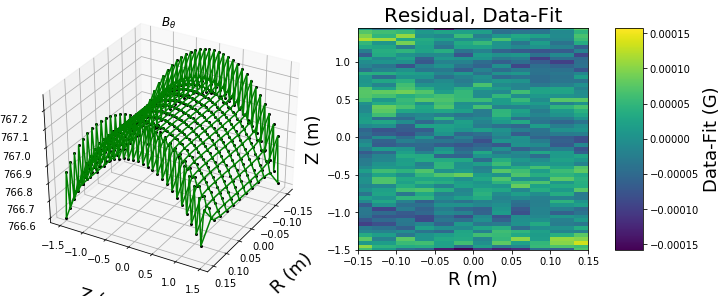

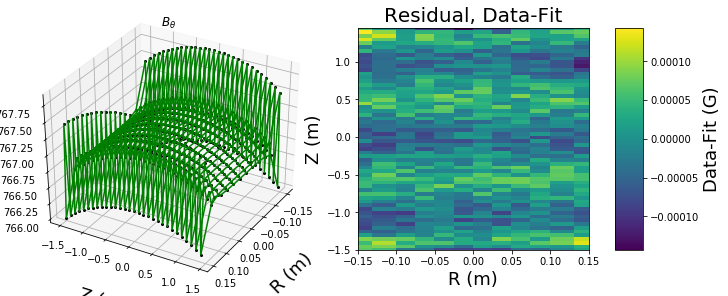

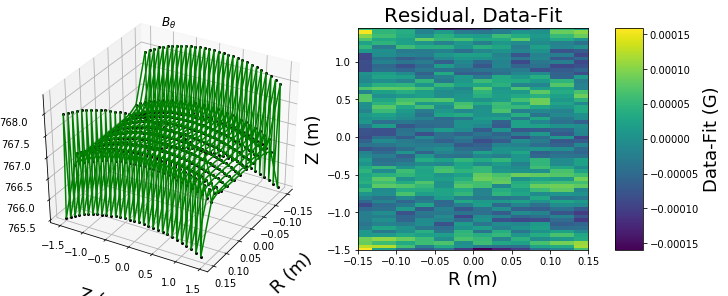

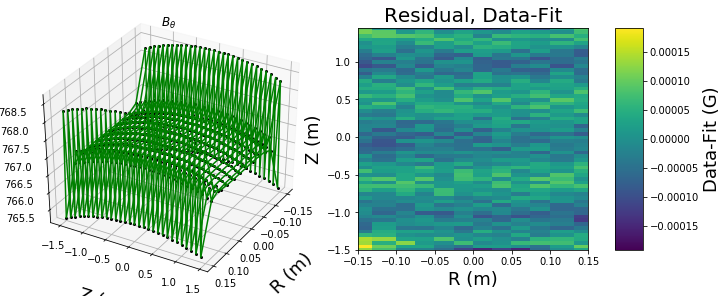

In [18]:
for phi in (0, np.pi/8, np.pi/4, 3*np.pi/8, np.pi/2, 5*np.pi/8, 3*np.pi/4, 7*np.pi/8):
    fig = mu2e_plot3d(ff.input_data, 'R', 'Z', 'Bz', f'R<=0.15 and Phi=={phi} and -2<Z<2',
                title_simp = r'$B_{\theta}$', df_fit=True, mode='mpl', ptype='3d', units='m', aspect='rect2', do2pi=True)

In [19]:
cfg_pickle_Opt = cfg_pickle(use_pickle=False, save_pickle=False,
                             load_name='tmp', save_name='tmp', recreate=False)

cfg_geom_Cole_tmp         = cfg_geom('cyl', z_steps_cole_small, r_steps_250mm_true[0:],
                                            phi_steps_true[0:1], x_steps=None, y_steps=None,
                                            bad_calibration=[False, False, False],
                                            interpolate=False, do2pi=True)

cfg_params_Opt  = cfg_params(pitch1=0, ms_h1=0, ns_h1=0,
                                 pitch2=0.1, ms_h2=2, ns_h2=3,
                                 length1=9.2, ms_c1=5, ns_c1=3,
                                 length2=0, ms_c2=0, ns_c2=0,
                                 ks_dict={'k3':768},
                                 bs_tuples=((0.25, 0, -4.6),
                                            (0.25, 0, 4.6)),
                                 bs_bounds=(1e-3, 1e-3, 4),
                                 version=1000)
hmd, ff = field_map_analysis('fma_opt_test', cfg_data_Cole_250mm_short_cyl,
                                  cfg_geom_Cole_tmp, cfg_params_Opt,
                                  cfg_pickle_Opt, cfg_plot_none)

fitting with func_version=1000,
cfg_params(pitch1=0, ms_h1=0, ns_h1=0, pitch2=0.1, ms_h2=2, ns_h2=3, length1=9.2, ms_c1=5, ns_c1=3, length2=0, ms_c2=0, ns_c2=0, ks_dict={'k3': 768}, bs_tuples=((0.25, 0, -4.6), (0.25, 0, 4.6)), bs_bounds=(0.001, 0.001, 4), version=1000)


/home/ckampa/anaconda3/envs/Mu2E/lib/python3.7/site-packages/scipy/optimize/_lsq/least_squares.py:111: UserWarning:

`ftol` is too low, setting to machine epsilon 2.220446049250313e-16.

/home/ckampa/anaconda3/envs/Mu2E/lib/python3.7/site-packages/scipy/optimize/_lsq/least_squares.py:114: UserWarning:

`xtol` is too low, setting to machine epsilon 2.220446049250313e-16.

/home/ckampa/anaconda3/envs/Mu2E/lib/python3.7/site-packages/scipy/optimize/_lsq/least_squares.py:117: UserWarning:

`gtol` is too low, setting to machine epsilon 2.220446049250313e-16.



`xtol` termination condition is satisfied.
Function evaluations 417, initial cost 1.6990e+09, final cost 7.0004e+00, first-order optimality 1.60e+05.
Elapsed time was 73.5545 seconds
[[Fit Statistics]]
    # fitting method   = least_squares
    # function evals   = 417
    # data points      = 2160
    # variables        = 58
    chi-square         = 14.0008553
    reduced chi-square = 0.00666073
    Akaike info crit   = -10767.6894
    Bayesian info crit = -10438.3733
[[Variables]]
    pitch1:   0 (fixed)
    ms_h1:    0 (fixed)
    ns_h1:    0 (fixed)
    pitch2:   0.1 (fixed)
    ms_h2:    2 (fixed)
    ns_h2:    3 (fixed)
    length1:  9.2 (fixed)
    ms_c1:    5 (fixed)
    ns_c1:    3 (fixed)
    length2:  0 (fixed)
    ms_c2:    0 (fixed)
    ns_c2:    0 (fixed)
    Ah2_0_0:  1.6212e-08 (init = -1e-06)
    Bh2_0_0: -1.4498e-10 (init = 1e-06)
    Ch2_0_0:  0 (fixed)
    Dh2_0_0:  0 (fixed)
    Ah2_0_1: -1.2163e-06 (init = -1e-06)
    Bh2_0_1:  1.6145e-05 (init = 1e-06)
    Ch2_0_

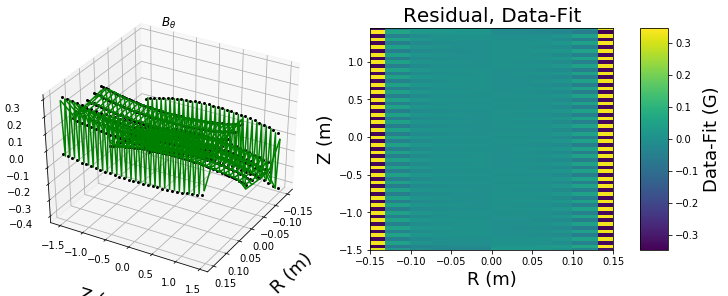

In [20]:
fig = mu2e_plot3d(ff.input_data, 'R', 'Z', 'Bphi', f'R<=0.15 and Phi==0 and -2<Z<2',
            title_simp = r'$B_{\theta}$', df_fit=True, mode='mpl', ptype='3d', units='m', aspect='rect2', do2pi=True)